In [1]:
import os
import xarray as xr
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.pyplot import *
import cartopy.crs as ccrs

In [2]:
import warnings
warnings.filterwarnings('ignore')

### Python 3
### xarray = 0.11.3
### numpy = 1.15.0
### matplotlib = 2.2.2
### cartopy = 0.16.0

Sentinel-1 A and B satellites, part of Europe’s Copernicus programme, were launched in April 2014 and 2016, respectively. The satellites fly in the same polar orbital plane, but 180° out of orbital phase, and offer a 6-day repeat cycle at the equator and more frequently at higher latitudes. Both satellites are equipped with identical C-band SAR instruments, which can measure the directional wind-wave spectra for wavelengths longer than ~150m in azimuth direction. In the open ocean, they operate in wave mode (WV), measuring alternately in near-range with an incidence angle of ~23.5° (WV1) and far-range with an incidence angle of ~36.5° (WV2), and acquire 20 km x 20 km vignettes every 100 km along-track. Since they alternate between WV1 and WV2, consecutive vignettes for each incidence angle are 200 km apart. The transmit-receive electromagnetic polarisation pair of choice in wave mode is VV, but some experimental HH data have also been acquired.

This dataset contains Sentinel-1 A and B SAR measurements over the Asutralasian region. This is the amount of data for each sattelite (A and B) for different wave modes (WV1 and WV2) and orbit's direction (ascending or descending passes), allocated in 2.5°x2.5° bins:

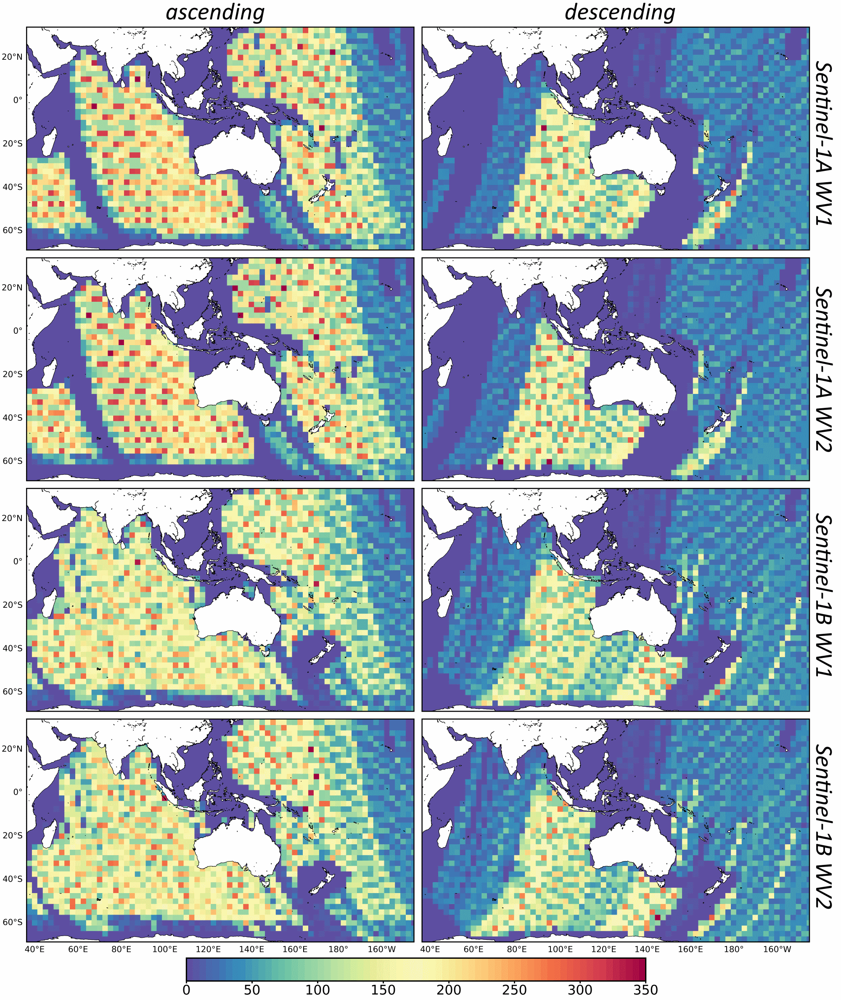

The data is accesible through the AODN portal (https://portal.aodn.org.au/), or http://thredds.aodn.org.au/thredds/catalog/IMOS/SRS/Surface-Waves/SAR/catalog.html

## Open the data for the 1st of August 2019

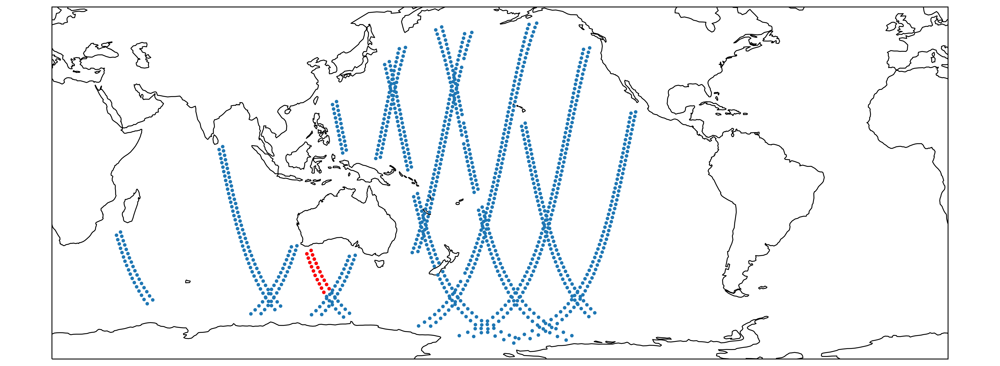

In [3]:
ds_s1 = xr.open_dataset('http://thredds.aodn.org.au/thredds/dodsC/IMOS/SRS/Surface-Waves/SAR/DELAYED/SENTINEL-1A/2019/08/IMOS_SRS-Surface-Waves_W_20190801T040752Z_Sentinel-1A_FV01_DM00_K2_END-20190801T220024Z.nc')

s1lats=ds_s1.LATITUDE
s1lons=ds_s1.LONGITUDE

plt.clf(); plt.close('all'); fig,ax = subplots(figsize=(20,10),dpi=300)
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=195))
ax.coastlines()
ax.plot(s1lons,s1lats,'.',transform=ccrs.PlateCarree())
ax.plot(s1lons[384:404],s1lats[384:404],'r.',transform=ccrs.PlateCarree())
plt.show()

The dataset contains all the satellite tracks that have observations in the Copernicus Australasia regional data hub, that is why some observations might also fall outside this area. 

In [4]:
# Select the data for the locations marked in red south of Australia
ds_SA = ds_s1.isel(TIME=slice(384,404))
dates = [np.array(ds_SA.TIME)[i] for i in range(len(ds_SA.TIME))]
lons_SA = np.array(ds_SA.LONGITUDE)
lats_SA = np.array(ds_SA.LATITUDE)

## Plot some SAR parameters

satellite track heading clockwise relative to north


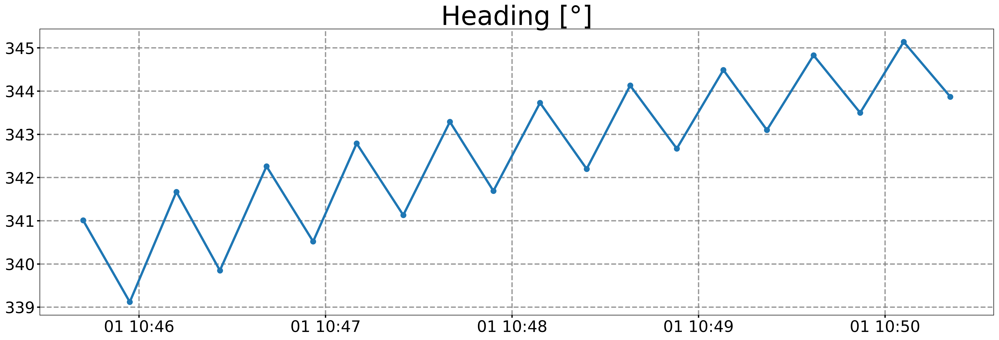

In [5]:
# Heading
print(ds_SA.HEADING.attrs['long_name'])
plt.clf(); plt.close('all'); plt.figure(figsize=(26,8),dpi=300)
plt.grid(linestyle='--',linewidth=2,color='grey',alpha=0.8)
plt.plot(dates,ds_SA.HEADING,'.-',linewidth=3.5,markersize=16)
plt.tick_params(size=4,width=2,labelsize=24); 
plt.title('Heading [°]',size=40)
plt.show()

incidence angle


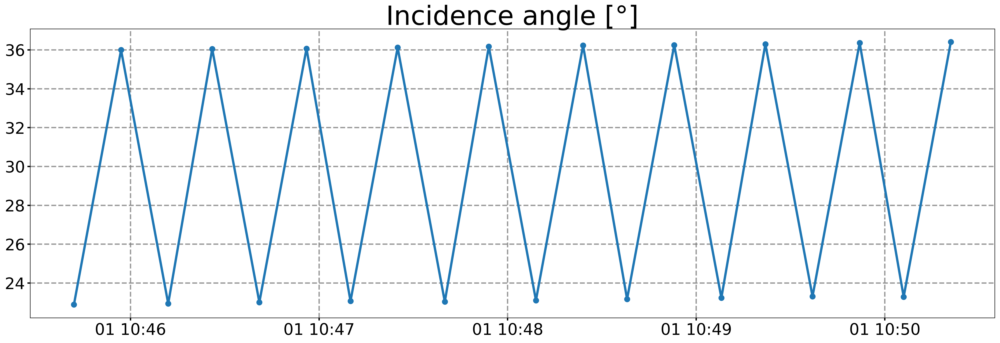

In [7]:
# Incidence angle
print(ds_SA.INC_ANGLE.attrs['long_name'])
plt.clf(); plt.close('all'); plt.figure(figsize=(26,8),dpi=300)
plt.grid(linestyle='--',linewidth=2,color='grey',alpha=0.8)
plt.plot(dates,ds_SA.INC_ANGLE,'.-',linewidth=3.5,markersize=16)
plt.tick_params(size=4,width=2,labelsize=24); 
plt.title('Incidence angle [°]',size=40)
plt.show()

distance to nearest coastline


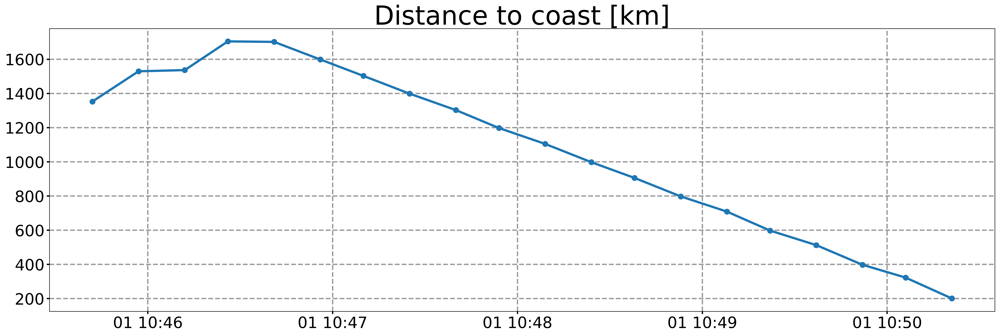

In [6]:
# Distance to coast
print(ds_SA.DIST2COAST.attrs['long_name'])
plt.clf(); plt.close('all'); plt.figure(figsize=(26,8),dpi=300)
plt.grid(linestyle='--',linewidth=2,color='grey',alpha=0.8)
plt.plot(dates,ds_SA.DIST2COAST,'.-',linewidth=3.5,markersize=16)
plt.tick_params(size=4,width=2,labelsize=24); 
plt.title('Distance to coast [km]',size=40)
plt.show()

sea_floor_depth_below_mean_sea_level


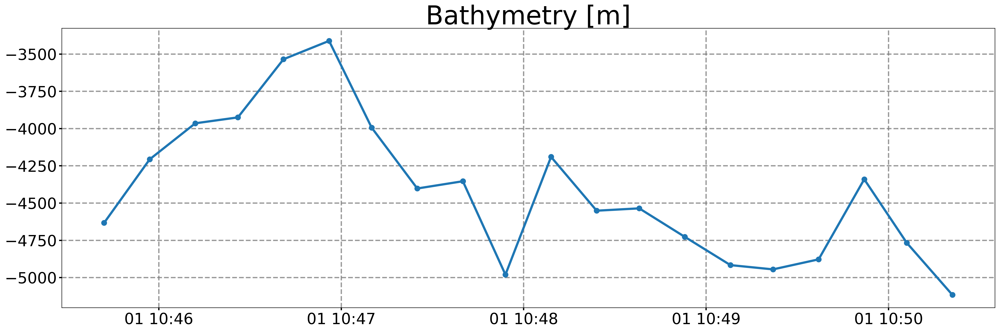

In [7]:
# Bathymetry
print(ds_SA.BOT_DEPTH.attrs['long_name'])
plt.clf(); plt.close('all'); plt.figure(figsize=(26,8),dpi=300)
plt.grid(linestyle='--',linewidth=2,color='grey',alpha=0.8)
plt.plot(dates,ds_SA.BOT_DEPTH,'.-',linewidth=3.5,markersize=16)
plt.tick_params(size=4,width=2,labelsize=24); 
plt.title('Bathymetry [m]',size=40)
plt.show()

### Compute swell parameters (Hs, Tm02, mean direction) from the directional spectrum

A directional wave spectrum describes how the wave energy (more specifically, the variance spectral density) is distributed over frequencies (or wavenumbers) and directions. For a detailed description of wave spectra, its uses and applications, and the transformations from wavenumber to frequency spectra, see: Holthuijsen, L. (2007). Waves in Oceanic and Coastal Waters. Cambridge: Cambridge University Press. https://doi.org/10.1017/CBO9780511618536

It is very common to describe the wave climate with integrated (also called bulk) wave parameters, instead of with a directional wave spectra. These parameters represent average conditions of the wave climate. 

In [8]:
s1_k = np.array(ds_SA.WAVNUM); 
s1_direction = np.array(ds_SA.DIRECTION);
s1_freq = np.array([np.sqrt(9.8*thek)/(2*np.pi) for thek in s1_k])
df_s1 = [s1_freq[i+1]-s1_freq[i] for i in range(len(s1_freq)-1)]
df_s1.append(df_s1[-1])

s1_Ekth = np.array(ds_SA.EKTH)
s1_Efth = np.zeros(np.shape(s1_Ekth))
for t in range(len(dates)): 
    for p in range(len(s1_k)):
        s1_Efth[t,:,p] = 4*np.pi*np.sqrt((s1_k[p]**3)/9.8)*s1_Ekth[t,:,p]
        
s1_Ef = np.nansum(s1_Efth,axis=1)*5*(np.pi/180)
s1_m0 = np.nansum(s1_Ef*df_s1,axis=1)
s1_m2 = np.nansum((s1_freq**2)*s1_Ef*df_s1,axis=1)

s1_Hs = 4*np.sqrt(s1_m0)
s1_Tm02 = np.sqrt(s1_m0/s1_m2)

s1_sin_dir = np.sin(np.deg2rad(s1_direction))
s1_cos_dir = np.cos(np.deg2rad(s1_direction))

s1_mean_dir=[]
for T in range(len(dates)):
    s1_b = np.nansum((np.nansum(s1_sin_dir*np.transpose(s1_Efth[T,:,:]),axis=1)*5*(np.pi/180))*df_s1)
    s1_a = np.nansum((np.nansum(s1_cos_dir*np.transpose(s1_Efth[T,:,:]),axis=1)*5*(np.pi/180))*df_s1)
    s1_mdir = np.arctan2(s1_b,s1_a)*180/np.pi
    if s1_mdir<0:
        s1_mdir=s1_mdir+360
    s1_mean_dir.append(s1_mdir)

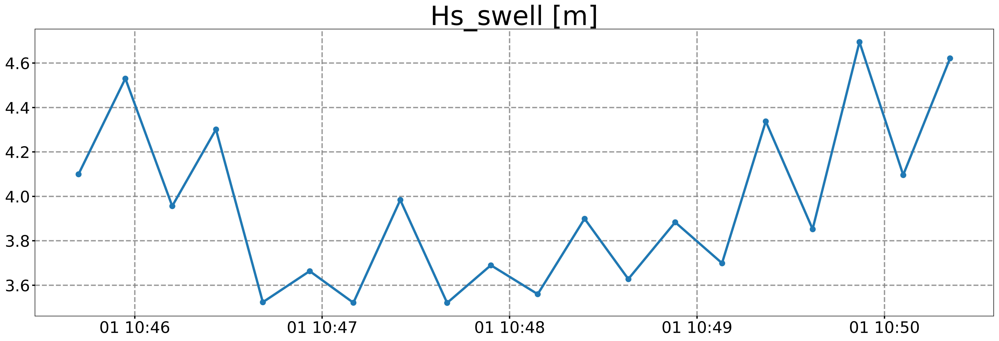

In [9]:
# Hs_swell
plt.clf(); plt.close('all'); plt.figure(figsize=(26,8),dpi=300)
plt.grid(linestyle='--',linewidth=2,color='grey',alpha=0.8)
plt.plot(dates,s1_Hs,'.-',linewidth=3.5,markersize=16)
plt.tick_params(size=4,width=2,labelsize=24); 
plt.title('Hs_swell [m]',size=40)
plt.show()

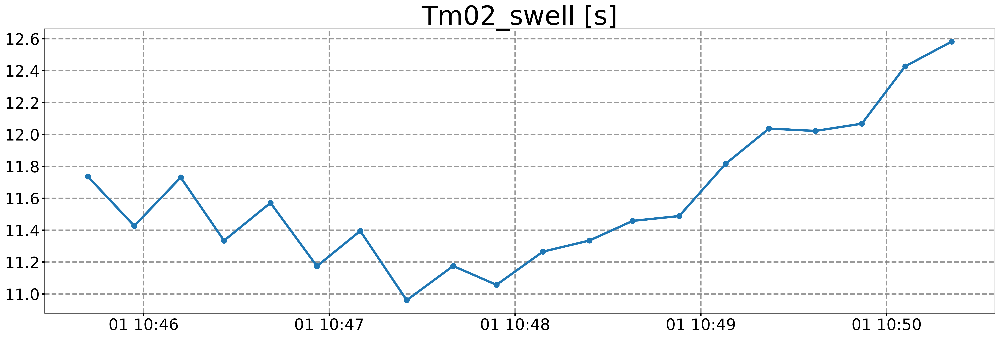

In [10]:
# Tm02_swell
plt.clf(); plt.close('all'); plt.figure(figsize=(26,8),dpi=300)
plt.grid(linestyle='--',linewidth=2,color='grey',alpha=0.8)
plt.plot(dates,s1_Tm02,'.-',linewidth=3.5,markersize=16)
plt.tick_params(size=4,width=2,labelsize=24); 
plt.title('Tm02_swell [s]',size=40)
plt.show()

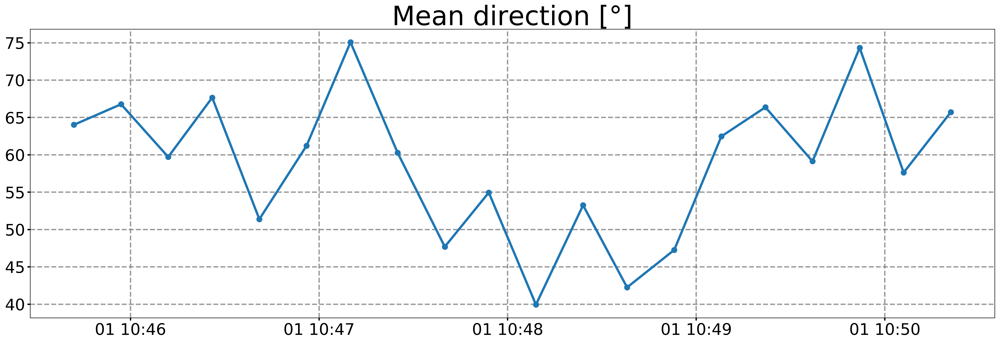

In [11]:
# Mean direction (swell)
plt.clf(); plt.close('all'); plt.figure(figsize=(26,8),dpi=300)
plt.grid(linestyle='--',linewidth=2,color='grey',alpha=0.8)
plt.plot(dates,s1_mean_dir,'.-',linewidth=3.5,markersize=16)
plt.tick_params(size=4,width=2,labelsize=24); 
plt.title('Mean direction [°]',size=40)
plt.show()

## Plot the directional wave spectra

In [12]:
import matplotlib as mpl
import matplotlib.colors as mc
from PIL import Image
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

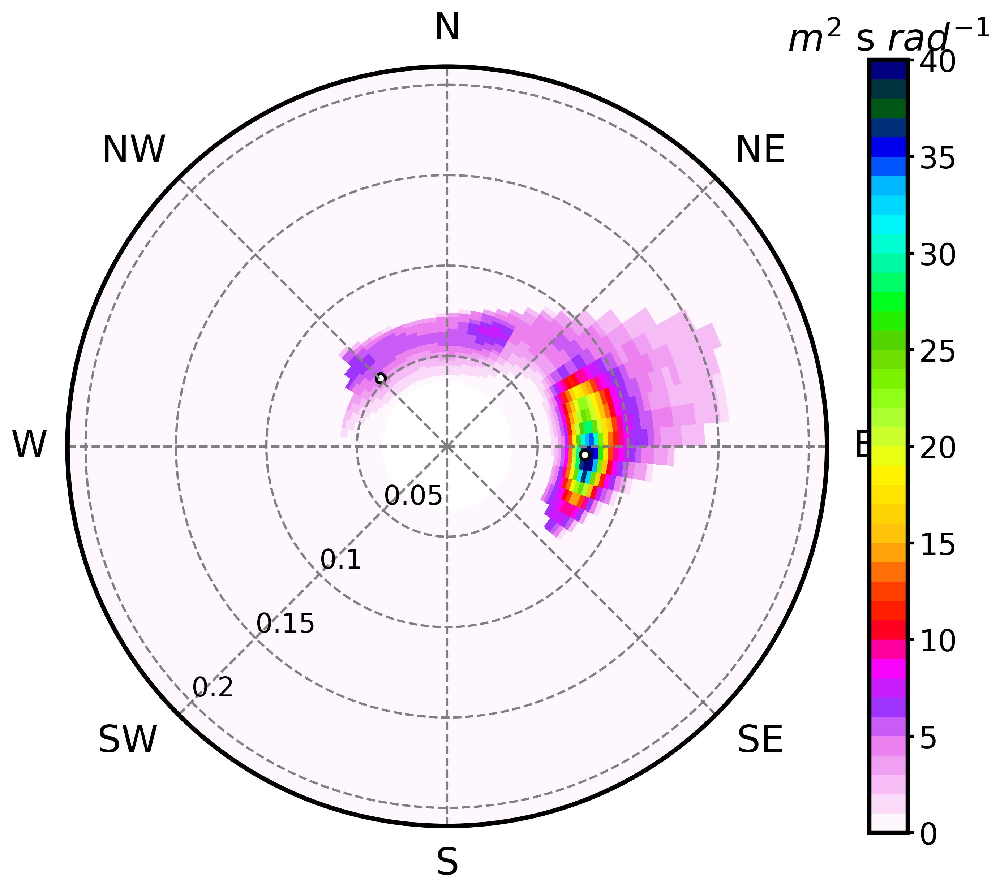

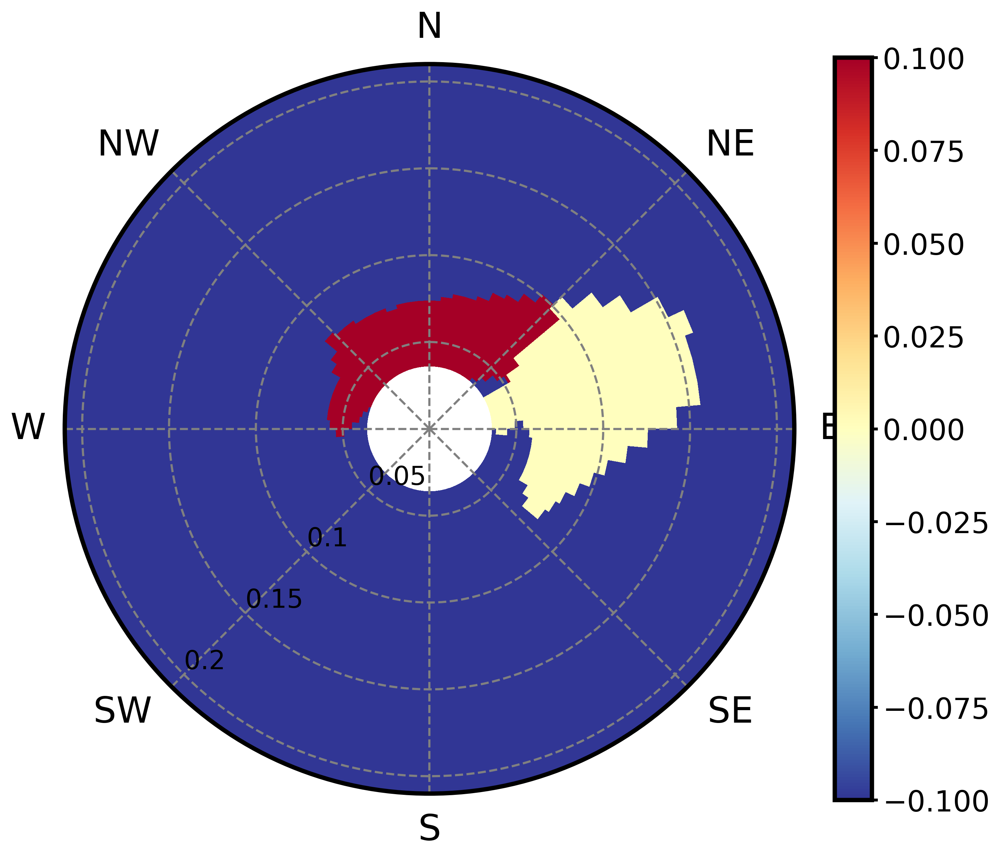

In [13]:
s1_dire = np.insert(s1_direction,len(s1_direction),s1_direction[0],axis=0)
s1_dirr,s1_freqq = np.meshgrid(np.radians(s1_dire),s1_freq)

out_path='/scratch1/kha061/SAR_notebook/'
mpl.rcParams['axes.linewidth']=3

# Plot data for the first time step
T=0

sdm=np.transpose(s1_Efth[T,:,:])
sdmm=np.zeros([len(s1_freq),len(s1_direction)+1]); sdmm[:,0:len(s1_direction)]=sdm; sdmm[:,len(s1_direction)]=sdm[:,0] 
part = np.transpose(np.array(ds_SA.EKTH_PART.isel(TIME=T))) # Wave partitions in k-th space 
part2 = np.zeros([len(s1_freq),len(s1_direction)+1]); part2[:,0:len(s1_direction)]=part; part2[:,len(s1_direction)]=part[:,0]
DP_part = np.array(ds_SA.DP_PART.isel(TIME=T))
WP_part = np.array(ds_SA.WP_PART.isel(TIME=T)); WF_part = np.sqrt(9.8/(2*np.pi*WP_part))

# Plot the spectrum
plt.clf(); plt.close('all'); fig,ax=subplots(subplot_kw=dict(projection='polar'),figsize=(10,10),dpi=300)
ax.set_theta_zero_location("N"); ax.set_theta_direction(-1);
levelss=np.arange(0,40.1,1); normm=mc.BoundaryNorm(levelss,256) # Set the colorbar limits

cax = ax.pcolormesh(s1_dirr,s1_freqq,sdmm,cmap='gist_ncar_r',norm=normm)
ax.scatter(np.radians(DP_part),WF_part,s=50,color='black')
ax.scatter(np.radians(DP_part),WF_part,s=10,color='white')

cbar = fig.colorbar(cax,orientation='vertical',pad=0.05,fraction=0.046)
cbar.ax.tick_params(size=4,width=2,labelsize=20); cbar.ax.set_title('$m^2$ s $rad^{-1}$',size=25)
ylocs=[0.05,0.1,0.15,0.2]; ylabels=['0.05','0.1','0.15','0.2']; plt.yticks(ylocs,ylabels,size=18)
ax.set_rlabel_position(135+90)
xlocs=np.radians([0,45,90,135,180,225,270,315]); xlabels=['N','   NE','E','   SE','S','SW    ','W','NW   ']; 
plt.xticks(xlocs,xlabels,size=25)
ax.xaxis.grid(True, zorder=0,linestyle='--',linewidth=1.5,color='grey')
ax.yaxis.grid(True, zorder=0,linestyle='--',linewidth=1.5,color='grey')
plt.ylim([0,0.21])
plt.show()

# PLot the wave partitions
plt.clf(); plt.close('all'); fig,ax=subplots(subplot_kw=dict(projection='polar'),figsize=(10,10),dpi=300)
ax.set_theta_zero_location("N"); ax.set_theta_direction(-1);

cax = ax.pcolormesh(s1_dirr,s1_freqq,part2,cmap='RdYlBu_r')

cbar = fig.colorbar(cax,orientation='vertical',pad=0.05,fraction=0.046)
cbar.ax.tick_params(size=4,width=2,labelsize=20); 
ylocs=[0.05,0.1,0.15,0.2]; ylabels=['0.05','0.1','0.15','0.2']; plt.yticks(ylocs,ylabels,size=18)
ax.set_rlabel_position(135+90)
xlocs=np.radians([0,45,90,135,180,225,270,315]); xlabels=['N','   NE','E','   SE','S','SW    ','W','NW   ']; 
plt.xticks(xlocs,xlabels,size=25)
ax.xaxis.grid(True, zorder=0,linestyle='--',linewidth=1.5,color='grey')
ax.yaxis.grid(True, zorder=0,linestyle='--',linewidth=1.5,color='grey')
plt.ylim([0,0.21])
plt.show()

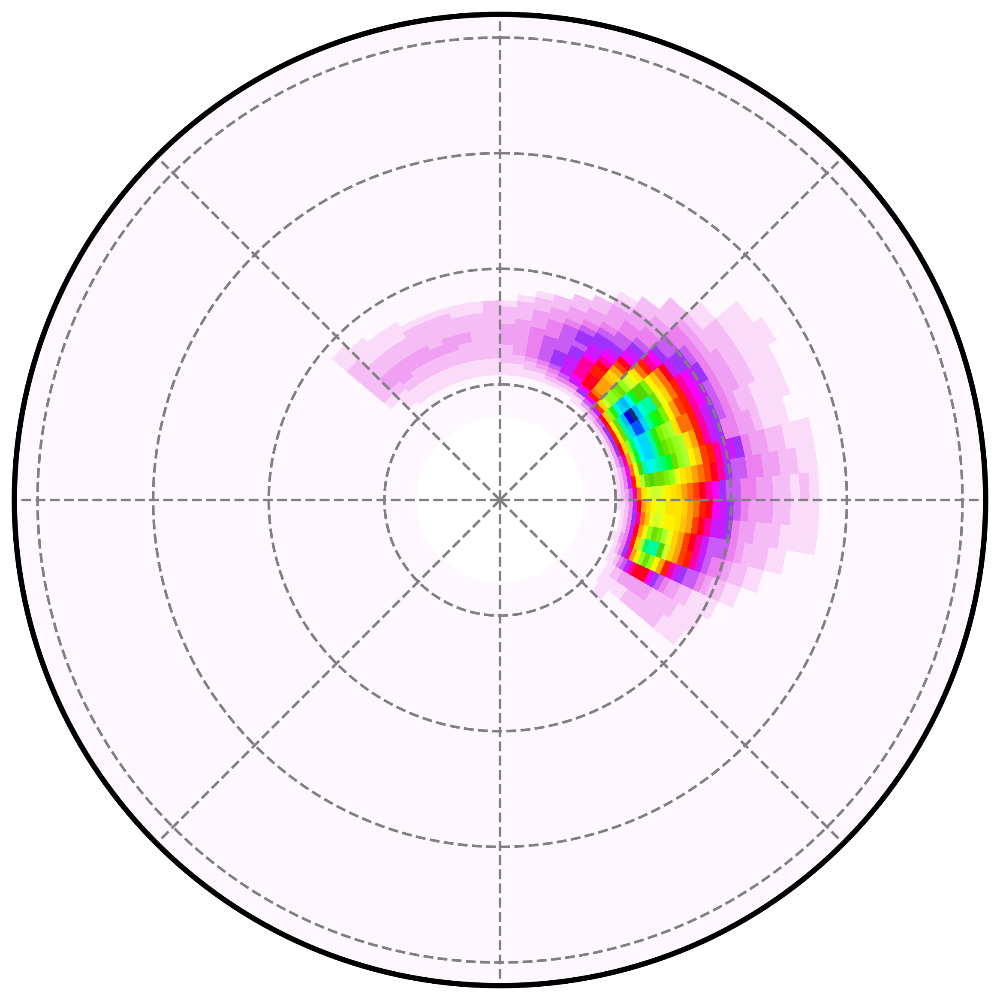

In [14]:
# Plot the spectra for all the time steps
for T in range(len(dates)):
    plt.clf(); plt.close('all'); fig,ax=subplots(subplot_kw=dict(projection='polar'),figsize=(10,10),dpi=300)
    ax.set_theta_zero_location("N"); ax.set_theta_direction(-1);
    levelss=np.arange(0,40.1,1); normm=mc.BoundaryNorm(levelss,256) # Set the colorbar limits
    sdm=np.transpose(s1_Efth[T,:,:])
    sdmm=np.zeros([len(s1_freq),len(s1_direction)+1]); sdmm[:,0:len(s1_direction)]=sdm; sdmm[:,len(s1_direction)]=sdm[:,0] 
    cax = ax.pcolormesh(s1_dirr,s1_freqq,sdmm,cmap='gist_ncar_r',norm=normm)
    
    ylocs=[0.05,0.1,0.15,0.2]; ylabels=['','','','']; plt.yticks(ylocs,ylabels,size=18)
    xlocs=np.radians([0,45,90,135,180,225,270,315]); xlabels=['','','','','','','','']; 
    plt.xticks(xlocs,xlabels,size=25)
    ax.xaxis.grid(True, zorder=0,linestyle='--',linewidth=1.5,color='grey')
    ax.yaxis.grid(True, zorder=0,linestyle='--',linewidth=1.5,color='grey')
    plt.ylim([0,0.21])
    #plt.show()
    plt.savefig(out_path+'spectrum_'+str(T)+'.png',bbox_inches='tight')

In [16]:
# Plot a map of them (together with the CAWCR hindcast spectral output)
os.chdir(out_path)

ds_ww3 = xr.open_dataset('http://data-cbr.csiro.au/thredds/dodsC/catch_all/CMAR_CAWCR-Wave_archive/CAWCR_Wave_Hindcast_aggregate/spec/ww3.201908_spec.nc')
ww3lons = np.array(ds_ww3['longitude'].isel(time=0))
ww3lats = np.array(ds_ww3['latitude'].isel(time=0))

plt.clf(); plt.close('all'); fig = plt.figure(figsize=(40,30),dpi=400)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([112,130.5,-58,-30], crs=ccrs.PlateCarree())
ax.coastlines('50m',linewidth=2.2)

ax.scatter(ww3lons,ww3lats,s=40)

for T in range(len(dates)-1,-1,-1):
    img = np.array(Image.open('spectrum_'+str(T)+'.png'))
    imagebox = OffsetImage(img,zoom=0.06)
    imagebox.image.axes = ax
    ab = AnnotationBbox(imagebox,(lons_SA[T],lats_SA[T]), xycoords='data', frameon=False)
    ax.add_artist(ab)

ax.set_yticks([-55,-50,-45,-40,-35], crs=ccrs.PlateCarree())
ax.set_xticks([115,120,125,130], crs=ccrs.PlateCarree())
plt.tick_params(size=6,width=3,labelsize=25)

plt.show()

## Compare the Sentinel-1 spectrum with a nearby WW3 spectrum

In [17]:
# Find the distance between two points in the surface of the Earth
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1 = np.deg2rad(lon1)
    lat1 = np.deg2rad(lat1)
    lon2 = np.deg2rad(lon2)
    lat2 = np.deg2rad(lat2)
    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a)) 
    r = 6372.8 # Radius of earth in kilometers
    return c * r

# Find the nearest value in an array to an input value (I'll use it for the az_cutoff)
def find_nearest(array,value):
    array = np.asarray(array)
    idx = (np.abs(array-value)).argmin()
    return idx,array[idx]

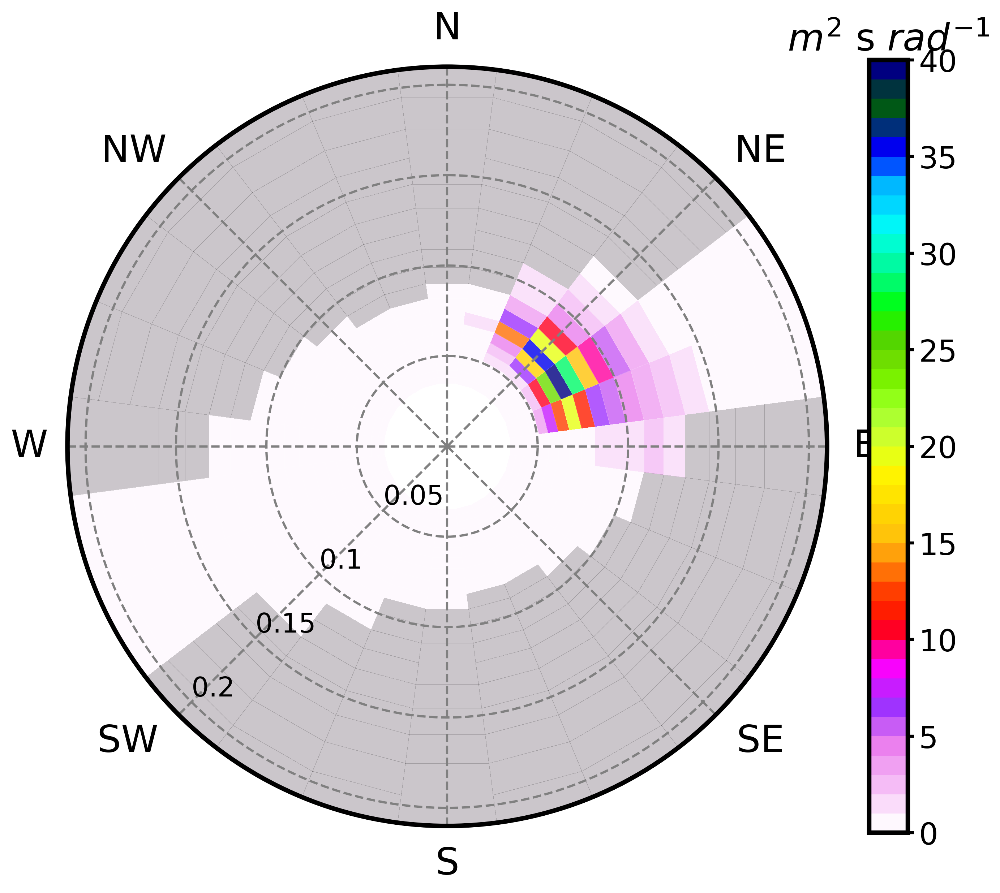

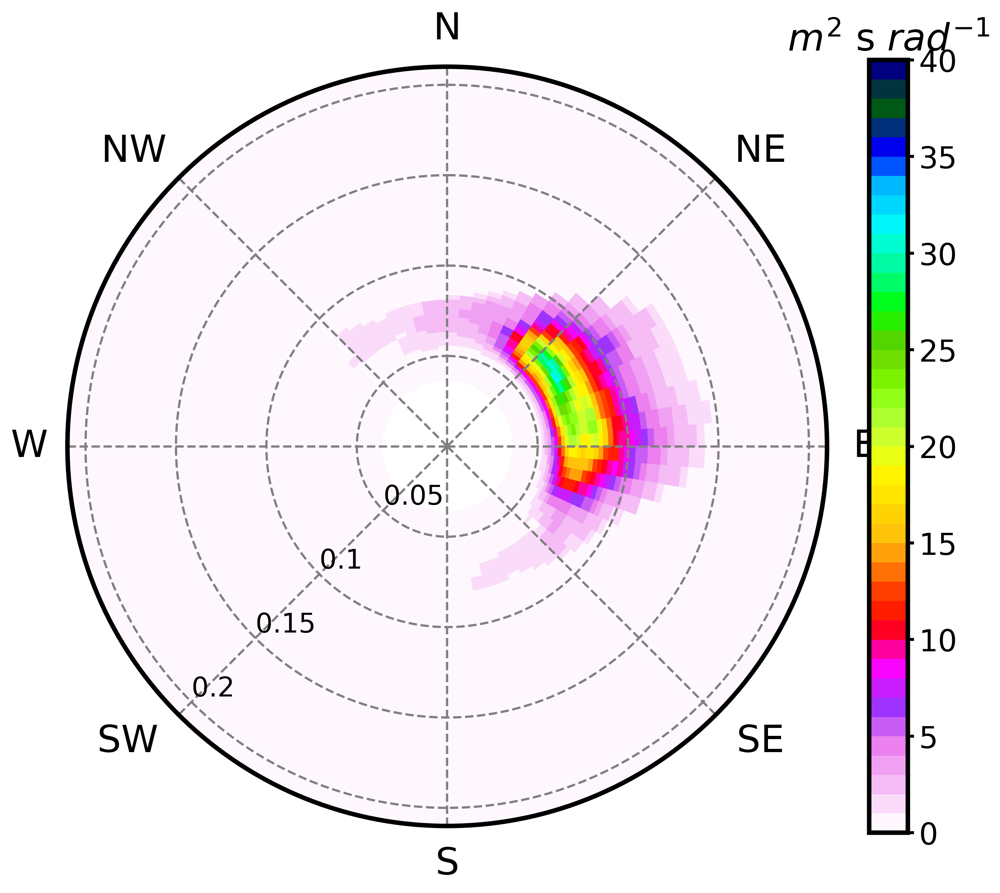

In [18]:
# Compute the distances to the WW3 spectral point at 120°E and 40°S
dist = haversine(lons_SA,lats_SA,120,-40)

# Find the Sentinel-1 observation that is less than 100 km from the WW3 output location
S1_idx = np.arange(len(dist))[dist<100][0]
S1_time = np.array(ds_SA.isel(TIME=S1_idx)['TIME'])

# Select the WW3 data at that location (120°E 40°S)
ww3_idx = int(np.where(np.logical_and(ww3lons == 120, ww3lats == -40))[0])
ww3_data = ds_ww3.sel(station=ww3_idx).sel(time=S1_time,method='nearest')

ww3_freq = np.array(ww3_data.frequency)
ww3_direction = np.array(ww3_data.direction)
sorted_ww3_direction=sorted(ww3_direction)

ww3_efth = np.array(ww3_data.efth)

# Filter the higher frequencies that SAR dosn't measure
s1_min_wavelens = np.array(ds_SA.AZ_CUTOFF_DIR.isel(TIME=S1_idx))
ww3_min_wavelens = np.zeros(24); cc=0
for uu in range(0,72,3):
    ww3_min_wavelens[cc]=np.mean(s1_min_wavelens[uu:uu+3])
    cc=cc+1

ww3_max_freq = np.sqrt((9.8/(2*np.pi))/ww3_min_wavelens)
ww3_max_freq_idx=np.zeros(len(ww3_max_freq)); ww3_max_freq_values=np.zeros(len(ww3_max_freq));
for pp in range(len(ww3_max_freq)):
    ww3_max_freq_idx[pp],ww3_max_freq_values[pp] = find_nearest(ww3_freq,ww3_max_freq[pp])

ww3_efth_new=np.copy(ww3_efth)

# Remove frequencies higher than the highest possible frequency:
ww3_efth_new[20::,:]=0*ww3_efth_new[20::,:] 

# Remove values outside the elipsoidal cut-off
for jj in range(len(ww3_max_freq_idx)):
    ww3_efth_new[int(ww3_max_freq_idx[jj])+1::,list(ww3_direction).index(sorted_ww3_direction[jj])]=0*ww3_efth_new[int(ww3_max_freq_idx[jj])+1::,list(ww3_direction).index(sorted_ww3_direction[jj])]

# Cut-off mask (for plotting)
cutoff_mask=np.zeros([29,25])
for i in range(24):
    cutoff_mask[int(ww3_max_freq_idx[i])+1::,list(ww3_direction).index(sorted_ww3_direction[i])]=np.ones(28-int(ww3_max_freq_idx[i]))
cutoff_mask[:,24]=cutoff_mask[:,0]
    
# Wrapp around directions
ww3_efth2=np.zeros([len(ww3_freq),len(ww3_direction)+1]); 
ww3_efth2[:,0:len(ww3_direction)]=ww3_efth_new; 
ww3_efth2[:,len(ww3_direction)]=ww3_efth_new[:,0] 

ww3_dire = np.insert(ww3_direction,len(ww3_direction),ww3_direction[0],axis=0)
ww3_dirr,ww3_freqq = np.meshgrid(np.radians(ww3_dire),ww3_freq)

# Plot the WW3 spectrum
plt.clf(); plt.close('all'); fig,ax=subplots(subplot_kw=dict(projection='polar'),figsize=(10,10),dpi=300)
ax.set_theta_zero_location("N"); ax.set_theta_direction(-1);
levelss=np.arange(0,40.1,1); normm=mc.BoundaryNorm(levelss,256) # Set the colorbar limits

cax = ax.pcolormesh(ww3_dirr,ww3_freqq,ww3_efth2,cmap='gist_ncar_r',norm=normm)
ax.pcolormesh(ww3_dirr,ww3_freqq,cutoff_mask,cmap='gist_yarg',alpha=0.2)

cbar = fig.colorbar(cax,orientation='vertical',pad=0.05,fraction=0.046)
cbar.ax.tick_params(size=4,width=2,labelsize=20); cbar.ax.set_title('$m^2$ s $rad^{-1}$',size=25)
ylocs=[0.05,0.1,0.15,0.2]; ylabels=['0.05','0.1','0.15','0.2']; plt.yticks(ylocs,ylabels,size=18)
ax.set_rlabel_position(135+90)
xlocs=np.radians([0,45,90,135,180,225,270,315]); xlabels=['N','   NE','E','   SE','S','SW    ','W','NW   ']; 
plt.xticks(xlocs,xlabels,size=25)
ax.xaxis.grid(True, zorder=0,linestyle='--',linewidth=1.5,color='grey')
ax.yaxis.grid(True, zorder=0,linestyle='--',linewidth=1.5,color='grey')
plt.ylim([0,0.21])
plt.show()

# Plot the Sentinel-1 spectrum
sdm=np.transpose(s1_Efth[S1_idx,:,:])
sdmm=np.zeros([len(s1_freq),len(s1_direction)+1]); sdmm[:,0:len(s1_direction)]=sdm; sdmm[:,len(s1_direction)]=sdm[:,0] 

plt.clf(); plt.close('all'); fig,ax=subplots(subplot_kw=dict(projection='polar'),figsize=(10,10),dpi=300)
ax.set_theta_zero_location("N"); ax.set_theta_direction(-1);
levelss=np.arange(0,40.1,1); normm=mc.BoundaryNorm(levelss,256) # Set the colorbar limits

cax = ax.pcolormesh(s1_dirr,s1_freqq,sdmm,cmap='gist_ncar_r',norm=normm)

cbar = fig.colorbar(cax,orientation='vertical',pad=0.05,fraction=0.046)
cbar.ax.tick_params(size=4,width=2,labelsize=20); cbar.ax.set_title('$m^2$ s $rad^{-1}$',size=25)
ylocs=[0.05,0.1,0.15,0.2]; ylabels=['0.05','0.1','0.15','0.2']; plt.yticks(ylocs,ylabels,size=18)
ax.set_rlabel_position(135+90)
xlocs=np.radians([0,45,90,135,180,225,270,315]); xlabels=['N','   NE','E','   SE','S','SW    ','W','NW   ']; 
plt.xticks(xlocs,xlabels,size=25)
ax.xaxis.grid(True, zorder=0,linestyle='--',linewidth=1.5,color='grey')
ax.yaxis.grid(True, zorder=0,linestyle='--',linewidth=1.5,color='grey')
plt.ylim([0,0.21])
plt.show()

The grey shaded area in the WAVEWATCH III spectra corresponds to the SAR's cut-off frequency (in reality, cut-off wavelength, the transformation to frequency was done assuming deep waters). The maximum frequency (or minimum wavelength) SAR is able to measure is a function of direction, and we have to filter these frequencies in the WW3 spectrum to perform a comparison.

The units of the spectra are m^2 s rad^(-1) because it is a directional frequency spectra. However, the original 2D spectrum in the SAR dataset is a directional wavenumber spectra with units of m^4. See https://doi.org/10.1017/CBO9780511618536 for details of the transformation from one to the other. 

In [19]:
# Compare Hs, Tm02, mean direction

# WW3
df_ww3=[ww3_freq[i+1]-ww3_freq[i] for i in range(28)]; df_ww3.append(df_ww3[-1])
ww3_1Dspec = np.nansum(ww3_efth,axis=1)*15*np.pi/180
ww3_m0 = np.nansum(ww3_1Dspec*df_ww3)
ww3_m2 = np.nansum((ww3_freq**2)*ww3_1Dspec*df_ww3)

ww3_Hs = 4*np.sqrt(ww3_m0)
ww3_Tm02 = np.sqrt(ww3_m0/ww3_m2)

ww3_sin_dir = np.sin(np.deg2rad(ww3_direction))
ww3_cos_dir = np.cos(np.deg2rad(ww3_direction))

ww3_b = np.nansum((np.nansum(ww3_sin_dir*ww3_efth,axis=1)*15*(np.pi/180))*df_ww3)
ww3_a = np.nansum((np.nansum(ww3_cos_dir*ww3_efth,axis=1)*15*(np.pi/180))*df_ww3)
ww3_mdir = np.arctan2(ww3_b,ww3_a)*180/np.pi
if ww3_mdir<0:
    ww3_mdir=ww3_mdir+360
    
# Sentinel-1
df_s1=[s1_freq[i+1]-s1_freq[i] for i in range(59)]; df_s1.append(df_s1[-1])
s1_efth = np.transpose(s1_Efth[S1_idx,:,:])
s1_1Dspec = np.nansum(s1_efth,axis=1)*5*np.pi/180
s1_m0 = np.nansum(s1_1Dspec*df_s1)
s1_m2 = np.nansum((s1_freq**2)*s1_1Dspec*df_s1)

s1_Hs = 4*np.sqrt(s1_m0)
s1_Tm02 = np.sqrt(s1_m0/s1_m2)

s1_sin_dir = np.sin(np.deg2rad(s1_direction))
s1_cos_dir = np.cos(np.deg2rad(s1_direction))

s1_b = np.nansum((np.nansum(s1_sin_dir*s1_efth,axis=1)*5*(np.pi/180))*df_s1)
s1_a = np.nansum((np.nansum(s1_cos_dir*s1_efth,axis=1)*5*(np.pi/180))*df_s1)
s1_mdir = np.arctan2(s1_b,s1_a)*180/np.pi
if s1_mdir<0:
    s1_mdir=s1_mdir+360
    
print('Hs WW3 = ',np.round(ww3_Hs,2),'|','Hs Sentinel-1 = ',np.round(s1_Hs,2))
print('Tm02 WW3 = ',np.round(ww3_Tm02,2),'|','Tm02 Sentinel-1 = ',np.round(s1_Tm02,2))
print('mdir WW3 = ',np.round(ww3_mdir,2),'|','mdir Sentinel-1 = ',np.round(s1_mdir,2))

Hs WW3 =  3.85 | Hs Sentinel-1 =  4.34
Tm02 WW3 =  8.48 | Tm02 Sentinel-1 =  12.04
mdir WW3 =  74.02 | mdir Sentinel-1 =  66.37
